# Statistical Deep Learning HW2 (Appendix)

## 王泓達 R13546017

In [7]:
import torch
from torch import nn
from torch.nn import functional as F
import torch.optim as optim
import torch.utils.data as data_utils
from torch.utils.data import Dataset, DataLoader, random_split
import tensorflow as tf
import lightning as L
from lightning.pytorch import LightningModule, LightningDataModule, Trainer
from lightning.pytorch.callbacks import EarlyStopping
from torch.utils.tensorboard import SummaryWriter
from pytorch_lightning.loggers import TensorBoardLogger
from lightning.pytorch.callbacks import Callback
import os
import math
import kagglehub
import pandas as pd
import random
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Question 1
Consider a 2-feature linear regression problem in which $x_1$ always lies in the range $[8, 9]$ and $x_2$ always lies in the range $[8000, 9000]$. $\\$ Comment on why gradient descent is likely to perform more efficiently after feature normalization by inspecting the 
objective function $\\$ over a toy training set with three examples.

### Data Generating

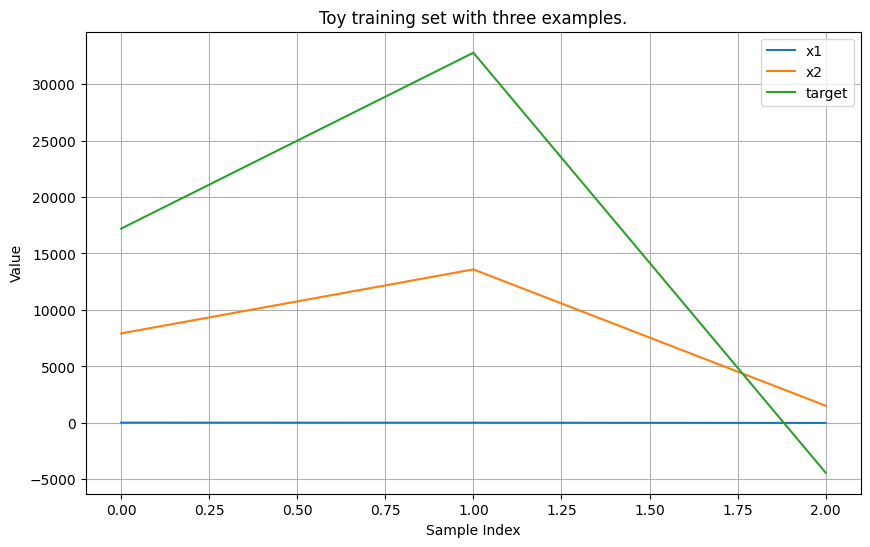

In [44]:
numbers = 3
np.random.seed(10)
x1 = np.random.normal(8, 9, numbers)
x2 = np.random.normal(8000, 9000, numbers)

features = np.vstack((np.ones(numbers), x1, x2)).T
target_o =   2 * x1 + 3 * x2 + np.random.normal(-9000,9000,numbers)
target =   target_o.reshape((3,1))

plt.figure(figsize=(10, 6))
plt.plot(x1, label="x1")
plt.plot(x2, label="x2")
plt.plot(target, label="target")
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.title("Toy training set with three examples.")
plt.legend()
plt.grid(True)
plt.show()

### Steepest Descent

In [57]:
scaler = StandardScaler()

for i in range(3):
    features_Normalization = (features - features.mean())/features.std()
    target_Normalization = (target - target.mean())/target.std()

def gradient_descent(X, y, w=np.zeros((3, 1)), learning_rate=0.001, iterations=10000):
    weights = [w]
    counter = 0
    for i in range(iterations):
        predictions = X.dot(w)
        gradient = (1/3) * (X.transpose().dot(predictions - y))
        tmp_w = w - learning_rate * gradient
        if np.linalg.norm(weights[-1] - tmp_w) < 1e-6 or np.linalg.norm(weights[-1] - tmp_w) > 1e6:
            break
        w = tmp_w
        counter += 1
        # print(w) 
    return w, counter

w_original, history = gradient_descent(features, target)
w_Normalization, history_Normalization = gradient_descent(features_Normalization, target_Normalization)
print(f"Iterations without Normalization: {history}")
print(f"Iterations with Normalization: {history_Normalization}")

res1 = (features[0].dot(w_original))[0]-target_o[0]
res2 = (features[1].dot(w_original))[0]-target_o[1]
res3 = (features[2].dot(w_original))[0]-target_o[2]
MSE_w = (res1**2 + res2**2 + res3**2)/3

res1 = (features_Normalization[0].dot(w_Normalization))[0]-target_Normalization.reshape((3))[0]
res2 = (features_Normalization[1].dot(w_Normalization))[0]-target_Normalization.reshape((3))[1]
res3 = (features_Normalization[2].dot(w_Normalization))[0]-target_Normalization.reshape((3))[2]
MSE_n = (res1**2 + res2**2 + res3**2)/3

print(f"MSE without Normalization: {MSE_w}")
print(f"MSE with Normalization: {MSE_n}")

Iterations without Normalization: 1
Iterations with Normalization: 10000
MSE without Normalization: 3.0614787301430943e+18
MSE with Normalization: 0.006784165810304229


### Comparison of Accuracy 

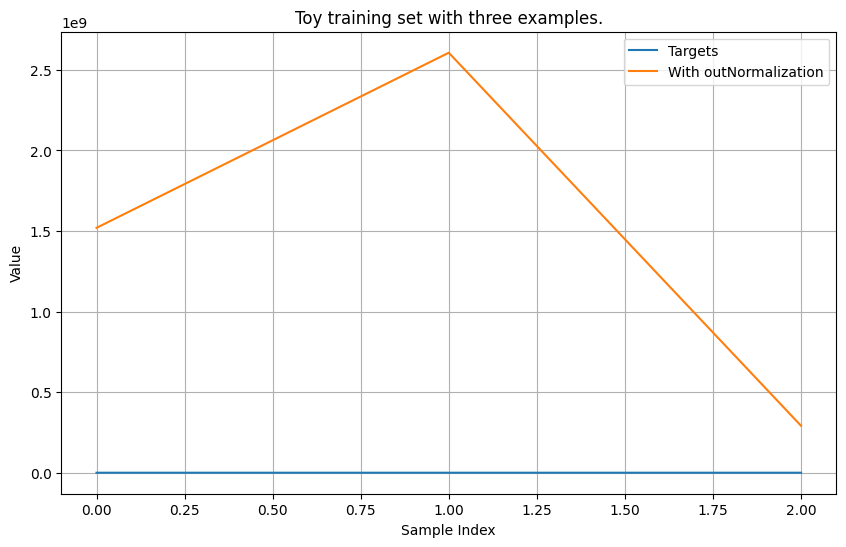

In [58]:
plt.figure(figsize=(10, 6))
plt.plot(target, label='Targets')
plt.plot(features.dot(w_original), label='With outNormalization')
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.title("Toy training set with three examples.")
plt.legend()
plt.grid(True)
plt.show()


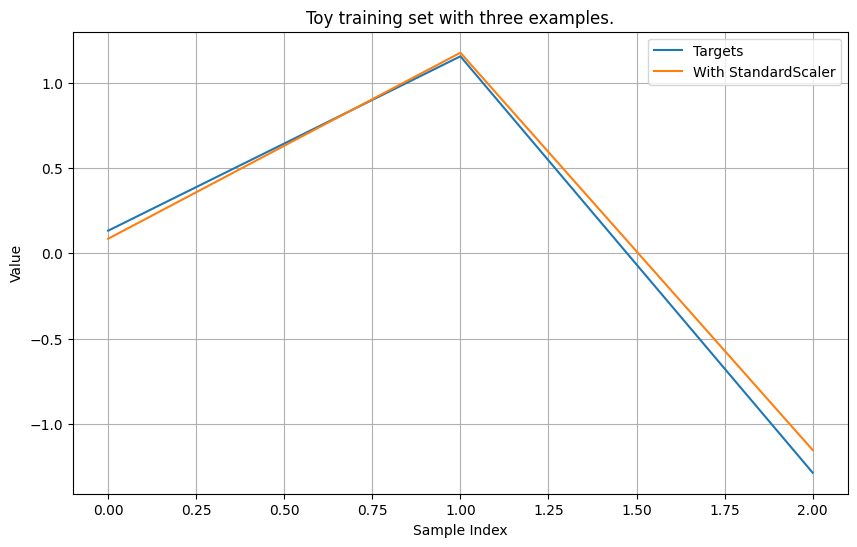

In [17]:
plt.figure(figsize=(10, 6))
plt.plot(target_Normalization, label='Targets')
plt.plot(features_Normalization.dot(w_StandardScaler), label='With StandardScaler')
plt.xlabel("Sample Index")
plt.ylabel("Value")
plt.title("Toy training set with three examples.")
plt.legend()
plt.grid(True)
plt.show()


## 2. 

### Reading the file

In [8]:
# Download latest version
path = kagglehub.dataset_download("satvshr/top-4-used-car-sales-datasets-combined")
# read the data as a Pandas dataframe
df = pd.read_csv(path+"/output.csv")
df

,brand,model,transmission,age,fuel,engine,km,owner,price,location,mileage,power,seats,type
0,mahindra,thar,manual,4.0,diesel,2184.0,11003.0,1.0,1231000.0,NaN,NaN,NaN,NaN,NaN
1,hyundai,verna,manual,6.0,petrol,1591.0,66936.0,1.0,786000.0,NaN,NaN,NaN,NaN,NaN
2,tata,harrier,manual,2.0,diesel,1956.0,27990.0,1.0,1489000.0,NaN,NaN,NaN,NaN,NaN
3,honda,city,automatic,1.0,petrol,1498.0,5061.0,1.0,1227000.0,NaN,NaN,NaN,NaN,NaN
4,ford,ecosport,manual,3.0,diesel,1498.0,23480.0,1.0,887000.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32195,datsun,redi go,manual,6.0,petrol,NaN,11500.0,1.0,292000.0,maharashtra,NaN,NaN,5.0,hatchback
32196,toyota,yaris,manual,6.0,petrol,NaN,73393.0,2.0,534000.0,karnataka,NaN,NaN,5.0,sedan
32197,volkswagen,ameo,manual,8.0,petrol,NaN,83810.0,2.0,424000.0,uttar pradesh,NaN,NaN,5.0,sedan
32198,hyundai,grand i10 nios,automatic,5.0,petrol,NaN,39162.0,1.0,685000.0,chandigarh,NaN,NaN,5.0,hatchback


### 2.a. 'feature': [Numbers, Rate]
Summarize the missing rates for each variable. That is, for each predictor $x$, what is the proportion of samples with missing values?

In [9]:
variable_is_na = {}

for i in df.columns:
    variable_is_na[i] = [0,0]
    for j in df[i]:
        if(pd.isna(j)):
            variable_is_na[i][0] += 1
    variable_is_na[i][1] += variable_is_na[i][0] / len(df[i])

variable_is_na

{'brand': [1, 3.1055900621118014e-05],
 'model': [1, 3.1055900621118014e-05],
 'transmission': [0, 0.0],
 'age': [1, 3.1055900621118014e-05],
 'fuel': [0, 0.0],
 'engine': [8132, 0.25254658385093165],
 'km': [0, 0.0],
 'owner': [15381, 0.47767080745341617],
 'price': [0, 0.0],
 'location': [18399, 0.5713975155279503],
 'mileage': [10820, 0.3360248447204969],
 'power': [10927, 0.3393478260869565],
 'seats': [2847, 0.08841614906832299],
 'type': [24185, 0.7510869565217392]}

### 2.b. Drop col-na(%) > 0.2 and row-na
Remove variables with missing rate greater than $0.2$ and samples with missing variables. How many samples are left?

In [10]:
columns_to_drop = []

for i in variable_is_na.keys():
    if variable_is_na[i][1] > 0.2:
        columns_to_drop.append(i)

print(f"columns_to_drop: {columns_to_drop}")

df.drop(columns=columns_to_drop, inplace=True)
df = df.dropna(axis=0)
df

columns_to_drop: ['engine', 'owner', 'location', 'mileage', 'power', 'type']


,brand,model,transmission,age,fuel,km,price,seats
2805,maruti,wagon,manual,14.0,cng,72000.0,175000.0,5.0
2806,hyundai,creta,manual,9.0,diesel,41000.0,1250000.0,5.0
2807,honda,jazz,manual,13.0,petrol,46000.0,450000.0,5.0
2808,maruti,ertiga,manual,12.0,diesel,87000.0,600000.0,7.0
2809,audi,a4,automatic,11.0,diesel,40670.0,1774000.0,5.0
...,...,...,...,...,...,...,...,...
32195,datsun,redi go,manual,6.0,petrol,11500.0,292000.0,5.0
32196,toyota,yaris,manual,6.0,petrol,73393.0,534000.0,5.0
32197,volkswagen,ameo,manual,8.0,petrol,83810.0,424000.0,5.0
32198,hyundai,grand i10 nios,automatic,5.0,petrol,39162.0,685000.0,5.0


##### Result: We have 29352 samples left

### 2.d. Data Transformation
Transform the categorical variables into one-hot encoding. $\\$
Standardize the numerical variables. Use the training dataset to fit the standardization model. $\\$
Apply the same model to the validation and testing datasets.$\\$ 
Summarize the transformed datasets.


#### Drop the element that rarely apeears

In [11]:
brand = []
for i in df["brand"]:
    if i not in brand:
        brand.append(i)
model = []
for i in df["model"]:
    if i not in model:
        model.append(i)
transmission = []
for i in df["transmission"]:
    if i not in transmission:
        transmission.append(i)
fuel = []
for i in df["fuel"]:
    if i not in fuel:
        fuel.append(i)

#### Selected main features

In [12]:
brand_times = {}
for i in brand:
    brand_times[i] = 0
for i in df["brand"]:
    brand_times[i] += 1 / 29352 

model_times = {}
for i in model:
    model_times[i] = 0
for i in df["model"]:
    model_times[i] += 1 / 29352 

transmission_times = {}
for i in transmission:
    transmission_times[i] = 0
for i in df["transmission"]:
    transmission_times[i] += 1 / 29352 

fuel_times = {}
for i in fuel:
    fuel_times[i] = 0
for i in df["fuel"]:
    fuel_times[i] += 1 / 29352 

brand_final = []
for i in brand_times:
    if brand_times[i] > 0.01:
        brand_final.append(i)
print(brand_final)
model_final = []
for i in model_times:
    if model_times[i] > 0.01:
        model_final.append(i)
print(model_final)
transmission_final = []
for i in transmission_times:
    if transmission_times[i] > 0.01:
        transmission_final.append(i)
print(transmission_final)
fuel_final = []
for i in fuel_times:
    if fuel_times[i] > 0.01:
        fuel_final.append(i)
print(fuel_final)

['maruti', 'hyundai', 'honda', 'audi', 'toyota', 'volkswagen', 'tata', 'renault', 'mercedes-benz', 'bmw', 'mahindra', 'ford', 'skoda']
['creta', 'jazz', 'ertiga', 'innova', 'vento', 'ciaz', 'city', 'swift', 'amaze', 'duster', 'i20', 'alto', 'vitara', 'polo', 'grand', 'kwid', 'i10', 'figo', 'xuv500', 'ecosport', 'verna', 'scorpio', 'baleno', 'celerio', 'wagon r', 'swift dzire', 'grand i10', 'elite i20', 'wagon r 1.0']
['manual', 'automatic']
['cng', 'diesel', 'petrol']


#### New interested dataframe

In [13]:
df_e = df.copy()

for i in ["brand", "model", "fuel", "transmission"]:
    for j in df_e.index:
        if df_e[i][j] not in (brand_final + fuel_final + model_final + transmission_final):
            df_e[i][j] = np.nan
        
df_e = df_e.dropna(axis=0)
df_e

C:\Users\User\AppData\Local\Temp\ipykernel_2544\1679625505.py:6: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_e[i][j] = np.nan
C:\Users\User\AppData\Local\Temp\ipykernel_2544\1679625505.py:6: SettingWithCopyWarning: 
A value is trying to

,brand,model,transmission,age,fuel,km,price,seats
2806,hyundai,creta,manual,9.0,diesel,41000.0,1250000.0,5.0
2807,honda,jazz,manual,13.0,petrol,46000.0,450000.0,5.0
2808,maruti,ertiga,manual,12.0,diesel,87000.0,600000.0,7.0
2812,toyota,innova,automatic,8.0,diesel,36000.0,1750000.0,8.0
2813,volkswagen,vento,manual,11.0,diesel,64430.0,520000.0,5.0
...,...,...,...,...,...,...,...,...
32188,mahindra,scorpio,manual,6.0,diesel,69010.0,1052000.0,5.0
32190,honda,city,automatic,9.0,petrol,23212.0,721000.0,5.0
32191,honda,city,manual,12.0,petrol,61301.0,371000.0,5.0
32192,renault,duster,automatic,3.0,petrol,11161.0,1285000.0,5.0


In [14]:
data_number = len(df_e)
features_age = np.zeros((19502,1))
features_km = np.zeros((19502,1))
features_seats = np.zeros((19502,1))
target_e = np.zeros((data_number, 1))
counter_e = 0

for i in df_e.index:
    features_age[counter_e,0] = float(df_e["age"][i])
    features_km[counter_e,0] = float(df_e["km"][i])
    features_seats[counter_e,0] = float(df_e["seats"][i])
    target_e[counter_e,0] = float(df_e["price"][i])
    counter_e += 1

df_e.drop(columns="age", inplace=True)
df_e.drop(columns="km", inplace=True)
df_e.drop(columns="seats", inplace=True)
df_e.drop(columns="price", inplace=True)

#### Standardize the numerical variables

In [20]:
scaler = StandardScaler()
features_age_standardized = scaler.fit_transform(features_age)
features_km_standardized = scaler.fit_transform(features_km)
features_seats_standardized = scaler.fit_transform(features_seats)
target_e_standardized = scaler.fit_transform(target_e)

features_num = np.hstack((features_age_standardized,features_km_standardized,target_e_standardized))
features_num

array([[ 0.60342918, -0.3268346 ,  2.35517753],
       [ 1.86036653, -0.21845392, -0.42654184],
       [ 1.54613219,  0.67026764,  0.09503054],
       ...,
       [ 1.54613219,  0.11321263, -0.70123662],
       [-1.28197684, -0.97362881,  2.47687775],
       [-0.33927383, -0.66680311, -0.06491832]])

#### Transform the categorical variables into one-hot encoding

In [16]:
features_cate = pd.get_dummies(df_e)
features_cat = features_cate.to_numpy()
features_cat = np.array(features_cat, dtype=np.float32)

features_cate

,brand_ford,brand_honda,brand_hyundai,brand_mahindra,brand_maruti,brand_renault,brand_toyota,brand_volkswagen,model_alto,model_amaze,...,model_verna,model_vitara,model_wagon r,model_wagon r 1.0,model_xuv500,transmission_automatic,transmission_manual,fuel_cng,fuel_diesel,fuel_petrol
2806,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,True,False
2807,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,True
2808,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,True,False,True,False
2812,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,True,False,False,True,False
2813,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32188,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,True,False
32190,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,True
32191,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,True
32192,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,True,False,False,False,True


In [21]:
features_e = np.hstack((features_num, features_cat))
data_columns = len(features_e[0])
features_e

array([[ 0.60342918, -0.3268346 ,  2.35517753, ...,  0.        ,
         1.        ,  0.        ],
       [ 1.86036653, -0.21845392, -0.42654184, ...,  0.        ,
         0.        ,  1.        ],
       [ 1.54613219,  0.67026764,  0.09503054, ...,  0.        ,
         1.        ,  0.        ],
       ...,
       [ 1.54613219,  0.11321263, -0.70123662, ...,  0.        ,
         0.        ,  1.        ],
       [-1.28197684, -0.97362881,  2.47687775, ...,  0.        ,
         0.        ,  1.        ],
       [-0.33927383, -0.66680311, -0.06491832, ...,  0.        ,
         0.        ,  1.        ]])

### 2.c. Split the entire dataset into training, validation, and testing datasets with a 70-20-10 ratio

In [19]:
feature_train_e = features_e[0:math.ceil(data_number*0.7)]
feature_val_e = features_e[math.ceil(data_number*0.7):math.ceil(data_number*0.9)]
feature_test_e = features_e[math.ceil(data_number*0.9):data_number]

target_train_e = target_e_standardized[0:math.ceil(data_number*0.7)]
target_val_e = target_e_standardized[math.ceil(data_number*0.7):math.ceil(data_number*0.9)]
target_test_e = target_e_standardized[math.ceil(data_number*0.9):data_number]

print(f"Numbers of feature_train : {len(feature_train_e)}")
print(f"Numbers of feature_validation : {len(feature_val_e)}")
print(f"Numbers of feature_test : {len(feature_test_e)}")

Numbers of feature_train : 13652
Numbers of feature_validation : 3900
Numbers of feature_test : 1950


### 2.e. Build the Model with Less than 100 Trainable Parameters.
Design a neural network model to predict the price of used cars. The model should have less than 100 trainable parameters. $\\$ 
Summarize the model architecture.


In [ ]:
class datasetSetUp(Dataset):
    def __init__(self, features, targets):
        self.features = features
        self.targets = targets

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        x = self.features[idx]
        y = self.targets[idx]
        return x, y

class dataModule(LightningDataModule):
    def __init__(self, feature_train_e, target_train_e, feature_val_e, target_val_e, batch_size=10):
        super().__init__()
        self.feature_train_e = torch.tensor(feature_train_e, dtype=torch.float32)
        self.target_train_e = torch.tensor(target_train_e, dtype=torch.float32)
        self.feature_val_e = torch.tensor(feature_val_e, dtype=torch.float32)
        self.target_val_e = torch.tensor(target_val_e, dtype=torch.float32)
        self.feature_test_e = torch.tensor(feature_test_e, dtype=torch.float32)
        self.target_test_e = torch.tensor(target_test_e, dtype=torch.float32)
        self.batch_size = batch_size

    def setup(self, stage=None):
        self.train_dataset_e = datasetSetUp(self.feature_train_e, self.target_train_e)
        self.val_dataset_e = datasetSetUp(self.feature_val_e, self.target_val_e)
        self.test_dataset_e = datasetSetUp(self.feature_test_e, self.target_test_e)

    def train_dataloader(self):
        return DataLoader(self.train_dataset_e, batch_size=self.batch_size, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.val_dataset_e, batch_size=self.batch_size, shuffle=False)
    
    def test_dataloader(self):
        return DataLoader(self.test_dataset_e, batch_size=self.batch_size, shuffle=False)

class neuralNetwork(LightningModule):
    def __init__(self):
        super().__init__()
        self.layer_1 = torch.nn.Linear(46, 2)
        self.layer_2 = torch.nn.Linear(2, 1)
        self.train_losses = []
        self.val_losses = []  

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = self.layer_1(x)
        x = torch.relu(x)
        x = self.layer_2(x)
        return x

    def MSE(self, logits, labels):
        return F.mse_loss(logits, labels)

    def training_step(self, train_batch, batch_idx):
        x, y = train_batch
        logits = self.forward(x)
        loss = self.MSE(logits, y)
        self.log('train_loss', loss)
        return loss

    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch
        logits = self.forward(x)
        loss = self.MSE(logits, y)
        self.log('val_loss', loss)

    def on_train_epoch_end(self):
        avg_train_loss = self.trainer.callback_metrics['train_loss'].item()
        self.train_losses.append(avg_train_loss)

    def on_validation_epoch_end(self):
        avg_val_loss = self.trainer.callback_metrics['val_loss'].item()
        self.val_losses.append(avg_val_loss)

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=1e-3)

data_module = dataModule(feature_train_e, target_train_e, feature_val_e, target_val_e, batch_size=10)
model = neuralNetwork()

trainer = Trainer(callbacks=[EarlyStopping(monitor="val_loss", mode="min")])
trainer.fit(model, data_module)
torch.save(model.state_dict(), 'model_weights.pth')

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name    | Type   | Params | Mode 
-------------------------------------------
0 | layer_1 | Linear | 94     | train
1 | layer_2 | Linear | 3      | train
-------------------------------------------
97        Trainable params
0         Non-trainable params
97        Total params
0.000     Total estimated model params size (MB)
2         Modules in train mode
0         Modules in eval mode


Epoch 7: 100%|██████████| 1366/1366 [00:04<00:00, 313.01it/s, v_num=5]      


### Plot the model in 2.e. (epochs $< 100$) 
Train the model for at most 100 epochs. $\\$
Plot the training and validation loss curves (𝑥-axis: epoch, 𝑦-axis: training/validation loss). $\\$ 
Is there any sign of overfitting/underfitting

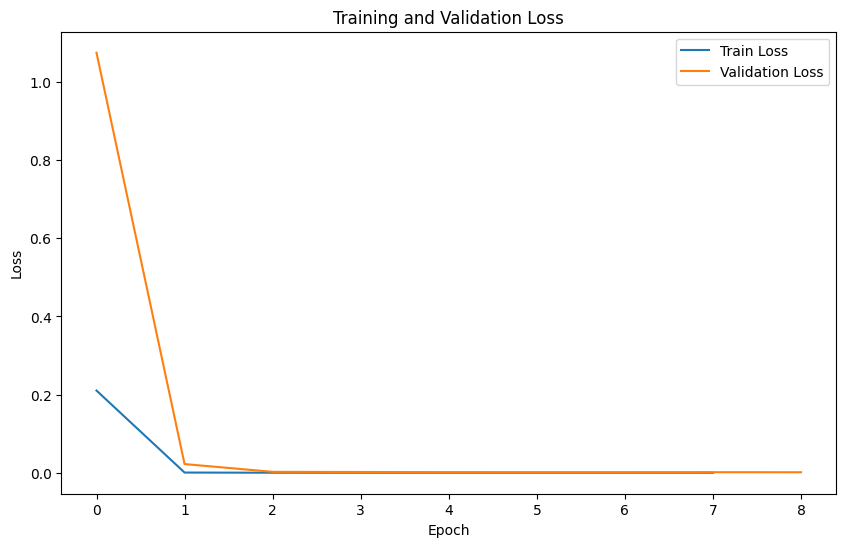

In [73]:
plt.figure(figsize=(10, 6))
plt.plot(model.train_losses, label='Train Loss')
plt.plot(model.val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

#### Comments: There is not any sign of overfitting or underfitting.

### 2.g. Change early stopping strategy of model in 2.e. 
Use the early stopping strategy: stop training if the validation loss increases by $1%$ in less than $10$ epochs. 

In [60]:
class datasetSetUp(Dataset):
    def __init__(self, features, targets):
        self.features = features
        self.targets = targets

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        x = self.features[idx]
        y = self.targets[idx]
        return x, y

class dataModule(LightningDataModule):
    def __init__(self, feature_train_e, target_train_e, feature_val_e, target_val_e, batch_size=10):
        super().__init__()
        self.feature_train_e = torch.tensor(feature_train_e, dtype=torch.float32)
        self.target_train_e = torch.tensor(target_train_e, dtype=torch.float32)
        self.feature_val_e = torch.tensor(feature_val_e, dtype=torch.float32)
        self.target_val_e = torch.tensor(target_val_e, dtype=torch.float32)
        self.feature_test_e = torch.tensor(feature_test_e, dtype=torch.float32)
        self.target_test_e = torch.tensor(target_test_e, dtype=torch.float32)
        self.batch_size = batch_size

    def setup(self, stage=None):
        self.train_dataset_e = datasetSetUp(self.feature_train_e, self.target_train_e)
        self.val_dataset_e = datasetSetUp(self.feature_val_e, self.target_val_e)
        self.test_dataset_e = datasetSetUp(self.feature_test_e, self.target_test_e)

    def train_dataloader(self):
        return DataLoader(self.train_dataset_e, batch_size=self.batch_size, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.val_dataset_e, batch_size=self.batch_size, shuffle=False)
    
    def test_dataloader(self):
        return DataLoader(self.test_dataset_e, batch_size=self.batch_size, shuffle=False)

class neuralNetwork(LightningModule):
    def __init__(self):
        super().__init__()
        self.layer_1 = torch.nn.Linear(46, 2)
        self.layer_2 = torch.nn.Linear(2, 1)
        self.train_losses = []
        self.val_losses = []  

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = self.layer_1(x)
        x = torch.relu(x)
        x = self.layer_2(x)
        return x

    def MSE(self, logits, labels):
        return F.mse_loss(logits, labels)

    def training_step(self, train_batch, batch_idx):
        x, y = train_batch
        logits = self.forward(x)
        loss = self.MSE(logits, y)
        self.log('train_loss', loss)
        return loss

    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch
        logits = self.forward(x)
        loss = self.MSE(logits, y)
        self.log('val_loss', loss)

    def on_train_epoch_end(self):
        avg_train_loss = self.trainer.callback_metrics['train_loss'].item()
        self.train_losses.append(avg_train_loss)

    def on_validation_epoch_end(self):
        avg_val_loss = self.trainer.callback_metrics['val_loss'].item()
        self.val_losses.append(avg_val_loss)

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=1e-3)

class earlyStoppingStrtegy(Callback):
    def __init__(self, max_val_epoch=10, rate=0.01):
        super().__init__()
        self.max_val_epoch = max_val_epoch
        self.rate = rate
        self.loss_up = -999
        self.loss_up_up = -999
        self.loss_now = 999
        self.loss_past = 999
        self.counter = 0

    def on_validation_epoch_end(self, trainer, pl_module):
        current_loss = trainer.callback_metrics["val_loss"].item()
        self.loss_past = self.loss_now 
        self.loss_now = current_loss
        if self.loss_now > self.loss_past and self.counter == 0:
            self.loss_up = self.loss_now
            self.counter+1
        elif self.loss_now > self.loss_past and self.counter != 0:
            self.loss_up_up = self.loss_now
            self.counter+1
            if self.loss_up_up > self.loss_up*self.rate and self.counter <= self.max_val_epoch:
                trainer.should_stop = True
        else:
            self.loss_up = -999
            self.loss_up_up = -999
            self.loss_now = 999
            self.loss_past = 999

data_module2 = dataModule(feature_train_e, target_train_e, feature_val_e, target_val_e, batch_size=10)
model2 = neuralNetwork()
early_stopping = earlyStoppingStrtegy(max_val_epoch=10, rate=0.01)
trainer2 = Trainer(callbacks=[early_stopping], max_epochs=100)

trainer2.fit(model2, data_module2)
torch.save(model2.state_dict(), 'model2_weights.pth')

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name    | Type   | Params | Mode 
-------------------------------------------
0 | layer_1 | Linear | 94     | train
1 | layer_2 | Linear | 3      | train
-------------------------------------------
97        Trainable params
0         Non-trainable params
97        Total params
0.000     Total estimated model params size (MB)
2         Modules in train mode
0         Modules in eval mode


C:\Users\User\AppData\Roaming\Python\Python310\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.
C:\Users\User\AppData\Roaming\Python\Python310\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Epoch 99: 100%|██████████| 1366/1366 [00:04<00:00, 336.39it/s, v_num=3]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 99: 100%|██████████| 1366/1366 [00:04<00:00, 336.10it/s, v_num=3]


#### Plot the loss

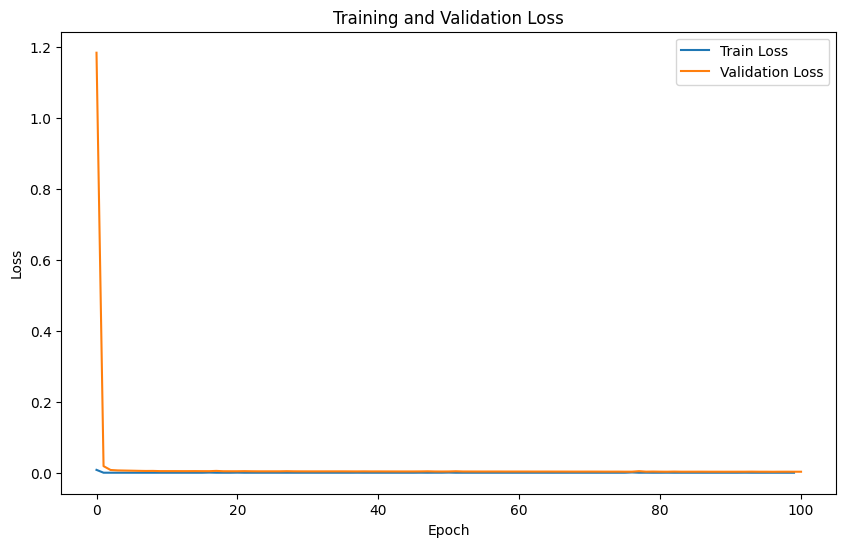

In [61]:
plt.figure(figsize=(10, 6))
plt.plot(model2.train_losses, label='Train Loss')
plt.plot(model2.val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

### 2.h.
Evaluate the models from (f) and (g) on the testing dataset. Report the mean squared error. $\\$
Run a linear regression model on the same dataset and report the mean squared error.$\\$ 
Comment on the results.


#### Compare MSE between (f) and (g)

In [74]:
model.load_state_dict(torch.load('model_weights.pth'))
model2.load_state_dict(torch.load('model2_weights.pth'))
model.eval()
model2.eval()

test_loader = data_module.test_dataloader()
features_for_testing = torch.tensor(feature_test_e, dtype = torch.float32)
target_for_testing = torch.tensor(target_test_e, dtype = torch.float32)

with torch.no_grad():  
    prediction = model(features_for_testing)  
    prediction2 = model2(features_for_testing)   

model_residual = (prediction-target_for_testing).numpy()
model_residual2 = (prediction2-target_for_testing).numpy()
residuals_model1 = []
residuals_model2 = []
MSE1_total = 0
MSE2_total = 0

for i in model_residual:
    residuals_model1.append(i[0])

for i in model_residual2:
    residuals_model2.append(i[0])

for i in residuals_model1:
    MSE1_total += i**2

for i in residuals_model2:
    MSE2_total += i**2

MSE1 = MSE1_total/len(model_residual)
MSE2 = MSE2_total/len(model_residual2)

print("MSE of model in (f): ", MSE1)
print("MSE of model in (g)", MSE2)

MSE of model in (f):  0.0009942181888444083
MSE of model in (g) 0.0034736029933334


C:\Users\User\AppData\Local\Temp\ipykernel_24408\2214252937.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('model_weights.pth'))
C:\Use

#### Linear regression model

In [65]:
predict_number = len(feature_test_e)
var_number = len(feature_test_e[0])

reg = LinearRegression().fit(feature_train_e, target_train_e)
predict_lr = np.zeros((1,predict_number))

for i in range(predict_number):
    predict_tmp = 0
    for j in range(var_number):
        predict_tmp += reg.coef_[0][j]*feature_test_e[i][j]
    predict_tmp += reg.intercept_
    predict_lr[0,i] = predict_tmp

C:\Users\User\AppData\Local\Temp\ipykernel_24408\2047336251.py:12: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  predict_lr[0,i] = predict_tmp


#### MSE of linear regression model

In [66]:
MSE_3 = 0.0
for i in range(predict_number):
    MSE_3 = (predict_lr[0,i]-target_test_e[i])**2

MSE_3 = MSE_3 / predict_number

print("MSE of linear regression model: ", MSE_3[0])

MSE of linear regression model:  1.1950642219018233e-35


#### MSE comparison of all methods

In [75]:
print("MSE of model in (f): ", MSE1)
print("MSE of model in (g)", MSE2)
print("MSE of linear regression model: ", MSE_3[0])

MSE of model in (f):  0.0009942181888444083
MSE of model in (g) 0.0034736029933334
MSE of linear regression model:  1.1950642219018233e-35


### 2.i. Draw the residual plots for the three models

$x$-axis: observed price; $y$: residual = predicted - observed $\\$
neural network from (f), neural network from (g), and linear regression

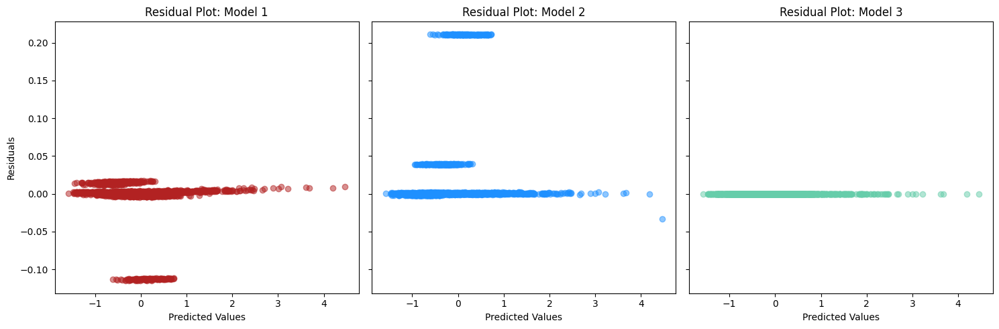

In [76]:
observation = target_test_e.reshape((1,1950))
residuals_model3 = predict_lr[0] - observation
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

axes[0].scatter(observation, residuals_model1, color='firebrick', alpha=0.5)
axes[0].set_title('Residual Plot: Model 1')
axes[0].set_xlabel('Predicted Values')
axes[0].set_ylabel('Residuals')

axes[1].scatter(observation, residuals_model2, color='dodgerblue', alpha=0.5)
axes[1].set_title('Residual Plot: Model 2')
axes[1].set_xlabel('Predicted Values')

axes[2].scatter(observation, residuals_model3, color='mediumaquamarine', alpha=0.5)
axes[2].set_title('Residual Plot: Model 3')
axes[2].set_xlabel('Predicted Values')

plt.tight_layout()
plt.show()


## Tensorboard

In [2]:
# Start tensorboard.
%load_ext tensorboard
%tensorboard --logdir=lightning_logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 18776), started 11 days, 5:44:19 ago. (Use '!kill 18776' to kill it.)